<a href="https://colab.research.google.com/github/JustTheCoolest/DataQuestContest/blob/main/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive

In [14]:
!pip install kaggle

In [16]:
drive.mount('/content/drive')

Mounted at /content/drive


In [17]:
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/DataQuest/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json  # Secure the file

In [18]:
!kaggle datasets download -d puneet6060/intel-image-classification


Dataset URL: https://www.kaggle.com/datasets/puneet6060/intel-image-classification
License(s): copyright-authors
 96% 333M/346M [00:06<00:00, 58.9MB/s]
100% 346M/346M [00:06<00:00, 56.3MB/s]


In [19]:
!unzip -q intel-image-classification.zip -d ./intel-image-classification


In [20]:
dataset_path = "./intel-image-classification/seg_train/seg_train"


In [46]:
import os
import numpy as np
import pandas as pd
from PIL import Image

# Set the dataset path
dataset_path = "/content/drive/MyDrive/Dataquest -Data/output"

# Validate dataset path
if not os.path.exists(dataset_path):
    raise ValueError(f"❌ Dataset path not found: {dataset_path}")

# Get all categories (folders)
categories = sorted([cat for cat in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, cat))])
num_categories = len(categories)

image_count = 0
corrupt_count = 0
dimensions = []
category_distribution = {}

for category in categories:
    category_path = os.path.join(dataset_path, category)

    if os.path.isdir(category_path):
        images = [img for img in os.listdir(category_path) if img.lower().endswith(('png', 'jpg', 'jpeg'))]
        category_distribution[category] = len(images)
        image_count += len(images)

        for img_file in images:
            img_path = os.path.join(category_path, img_file)
            try:
                with Image.open(img_path) as img:
                    dimensions.append(img.size)  # (width, height)
            except:
                corrupt_count += 1  # Count corrupt images

# Compute statistics for image dimensions
if dimensions:
    widths, heights = zip(*dimensions)
    avg_width, avg_height = np.mean(widths), np.mean(heights)
    min_width, max_width = min(widths), max(widths)
    min_height, max_height = min(heights), max(heights)
else:
    avg_width = avg_height = min_width = max_width = min_height = max_height = 0

# Summary Output
summary = {
    "Total Images (Including Corrupt)": image_count + corrupt_count,
    "Valid Images": image_count,
    "Corrupt Images": corrupt_count,
    "Total Categories": num_categories,
    "Avg Image Dimensions": (round(avg_width, 2), round(avg_height, 2)),
    "Image Dimension Range": {"Width": (min_width, max_width), "Height": (min_height, max_height)},
    "Category Distribution (%)": {cat: round((count / max(image_count, 1)) * 100, 2) for cat, count in category_distribution.items()}
}

# Convert to DataFrame for better readability
df_summary = pd.DataFrame.from_dict(summary, orient='index')
print(df_summary)


                                                                                  0
Total Images (Including Corrupt)                                               5754
Valid Images                                                                   5754
Corrupt Images                                                                    0
Total Categories                                                                 30
Avg Image Dimensions                                               (635.42, 500.93)
Image Dimension Range                   {'Width': (99, 5760), 'Height': (90, 7304)}
Category Distribution (%)         {'1': 1.67, '10': 5.34, '11': 1.89, '12': 3.7,...


In [47]:
import cv2

corrupt_images = []
valid_images = 0

for category in categories:
    category_path = os.path.join(dataset_path, category)
    if os.path.isdir(category_path):
        for img_file in os.listdir(category_path):
            img_path = os.path.join(category_path, img_file)
            try:
                img = cv2.imread(img_path)
                if img is None:
                    corrupt_images.append(img_path)
                else:
                    valid_images += 1
            except:
                corrupt_images.append(img_path)

# Print Summary
print(f"✅ Valid Images: {valid_images}")
print(f"❌ Corrupt or Unreadable Images: {len(corrupt_images)}")

# Show first 5 corrupt image paths (if any)
if corrupt_images:
    print("\n🔍 First 5 Corrupt Images:")
    for img in corrupt_images[:5]:
        print(img)


✅ Valid Images: 5754
❌ Corrupt or Unreadable Images: 0


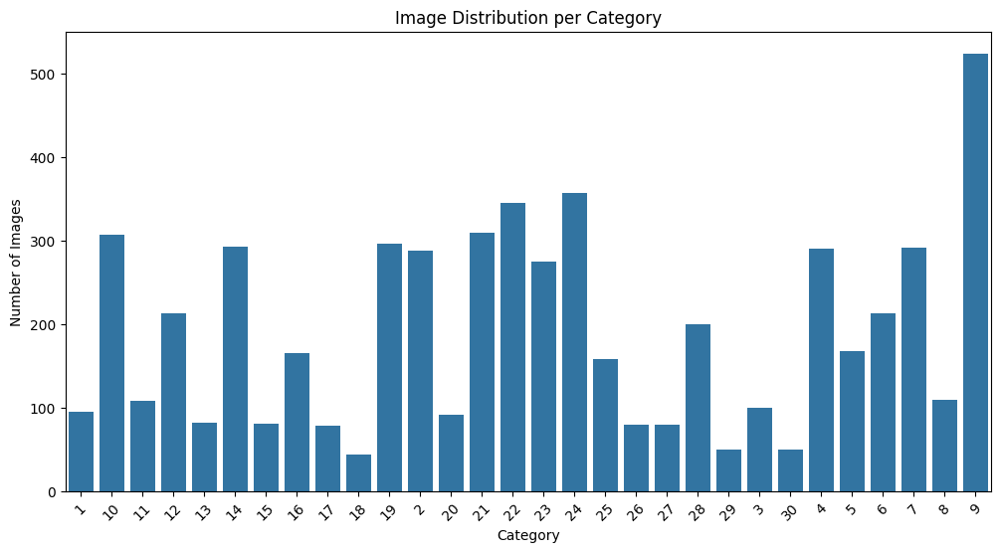

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.barplot(x=list(category_distribution.keys()), y=list(category_distribution.values()))
plt.xticks(rotation=45)
plt.xlabel('Category')
plt.ylabel('Number of Images')
plt.title('Image Distribution per Category')
plt.show()


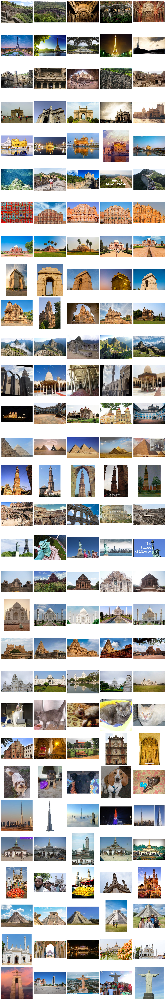

In [49]:
import random

fig, axes = plt.subplots(len(categories), 5, figsize=(15, len(categories) * 3))

for i, category in enumerate(categories):
    category_path = os.path.join(dataset_path, category)
    sample_images = random.sample(os.listdir(category_path), 5)

    for j, img_file in enumerate(sample_images):
        img_path = os.path.join(category_path, img_file)
        img = Image.open(img_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()


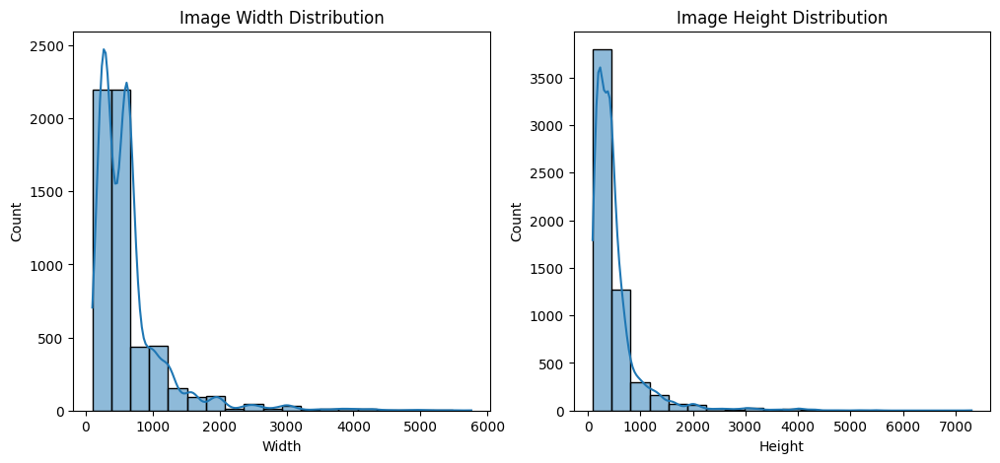

In [50]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(widths, bins=20, kde=True)
plt.xlabel('Width')
plt.title('Image Width Distribution')

plt.subplot(1, 2, 2)
sns.histplot(heights, bins=20, kde=True)
plt.xlabel('Height')
plt.title('Image Height Distribution')

plt.show()


In [51]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

target_size = (128, 128)  # Standardizing resolution

datagen = ImageDataGenerator(
    rescale=1./255,  # Normalization
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2]
)

train_generator = datagen.flow_from_directory(
    dataset_path,
    target_size=target_size,
    batch_size=32,
    class_mode='categorical'
)

print("✅ Data Augmentation & Preprocessing Done!")


Found 5754 images belonging to 30 classes.
✅ Data Augmentation & Preprocessing Done!
